
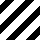
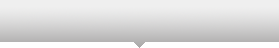
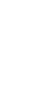
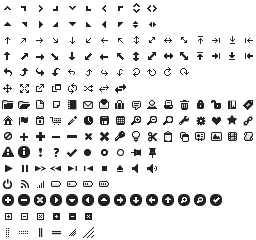
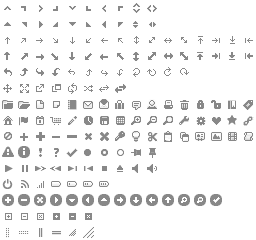
...
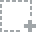
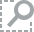
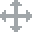
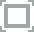
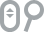

In [194]:
import math
import numpy as np
import soundfile as sf
from scipy import fftpack, signal

import bokeh.plotting as plt
import IPython.display
import markdown2
from bokeh.models import Range1d
from bokeh.plotting import ColumnDataSource

def display(text):
    IPython.display.display(IPython.display.HTML(markdown2.markdown(text)))

plt.output_notebook()

In [207]:
def make_plot(t, x, title):
    fig = plt.figure(title=title, tools='save', plot_width=700, plot_height=350)
    fig.line(t, x)
    return fig

In [206]:
file_path = 'data/LibriSpeech/dev-clean/1272/128104/1272-128104-0000.flac'
plot_rate = 10

x, data_rate = sf.read(file_path)
t = np.linspace(0, len(x) / data_rate, len(x))
fig = make_plot(t[::plot_rate], x[::plot_rate], title='Waveform Sampled At {} Hz'.
    format(data_rate // plot_rate))
plt.show(fig)

In [220]:
spectogram_colors = ['#f7f4f9', '#e7e1ef', '#d4b9da', '#c994c7', '#df65b0', '#e7298a',
    '#ce1256', '#980043', '#67001f']

def make_spectogram(X, window_stride_ms, title):
    assert len(X.shape) == 2
    window_count, window_length = X.shape[0], X.shape[1]
    
    log_X = np.log(np.ravel(X))
    times = np.repeat(window_stride_ms / 1000 * np.arange(0, window_count), window_length)
    assert len(times) == len(log_X)
    
    spec_min, spec_max = np.min(log_X), np.max(log_X)
    a = (len(spectogram_colors) - 1) / (spec_max - spec_min)
    b = -a * spec_min

    bins = np.tile(np.arange(0, window_length), window_count)
    bin_colors = [colors[int(round(a * s + b))] for s in log_X]
    source = ColumnDataSource(data=dict(times=times, bins=bins, colors=bin_colors))

    fig = plt.figure(title=title, x_range=Range1d(0, times[-1] + (window_stride_ms - 1) / 1000),
        y_range=Range1d(0, window_length - 1), x_axis_label='Time', y_axis_label='dB',
        plot_width=900, plot_height=450, tools='save')

    fig.grid.grid_line_color = None
    fig.axis.axis_line_color = None
    fig.axis.major_tick_line_color = None
    fig.rect('times', 'bins', window_stride_ms / 1000, 1, source=source, color='colors')
    return fig

In [224]:
def make_histogram(X, title, bins=50):
    hist, edges = np.histogram(np.ravel(np.log(X)), density=True, bins=bins)
    fig = plt.figure(title=title, tools='save', plot_width=900, plot_height=450)
    fig.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], color='#3182bd', line_color=None)
    return fig

In [226]:
window_dur_ms = 20
window_stride_ms = 10

window_length = data_rate * window_dur_ms // 1000
window_stride = data_rate * window_stride_ms // 1000
print("Window length: {}; window stride: {}.".format(window_len, window_stride))

rev_window = np.hamming(window_length)[::-1]
window_buffer = np.empty(window_length)
window_count = len(data) // window_stride + 1

st_dft = np.empty((window_count, window_length))
st_dct = np.empty((window_count, window_length))

def expand_dft(s):
    if window_len % 2 == 0:
        return np.concatenate((s, s[1:-1][::-1]))
    else:
        return np.concatenate((s, s[1:][::-1]))

for i, a in enumerate(range(0, len(data), window_stride)):
    b = min(a + window_length, len(data))
    np.copyto(dst=window_buffer[:b - a], src=data[a:b])
    
    # We choose to zero-pad the last window if necessary, rather than discard it.
    window_buffer[b:] = 0
    window_buffer = window_buffer * rev_window
    st_dft[i] = expand_dft(np.abs(np.fft.rfft(window_buffer)))
    st_dct[i] = np.abs(fftpack.dct(window_buffer))
    
display("""
## Short-Term Transformations

The compact energy representation of the DCT can be seen in both the histogram and the
spectogram. In particular, the mode of the DCT histogram is much more narrow than that
of the DFT histogram. The spectogram also shows that the DCT encodes more useful speech
information at lower frequencies.
""")

hist_1 = make_histogram(st_dft, 'Log DFT Magnitudes')
hist_2 = make_histogram(st_dct, 'Log DCT Magnitudes')

plt.show(hist_1)
plt.show(hist_2)
    
spec_1 = make_spectogram(st_dft, window_stride_ms, 'DFT Spectogram')
spec_2 = make_spectogram(st_dct, window_stride_ms, 'DCT Spectogram')

plt.show(spec_1)
plt.show(spec_2)

Window length: 320; window stride: 160.
